In [1]:
# import the required packages 
import tensorflow as tf
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt

In [2]:
image_size = 224
# data set path for train
train_path = r"C:\Users\Ranjith ch\Desktop\Thesis Track\Dataset\TRAIN"
# number of classes 
classes = ["healthy","glaucoma","myopia","maculopathy","diabeticretinopathy"]

# function for fetching the training data from the dataset 
train_data = []
def training_data():
    for cla in classes:
        path=os.path.join(train_path,cla)
        class_num=classes.index(cla)
        print(cla)
        for img in os.listdir(path):
            img_array = cv2.imread(os.path.join(path,img))
            img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB) 
            new_array=cv2.resize(img_array,(image_size,image_size))
            train_data.append([new_array,class_num])
training_data()

healthy
glaucoma
myopia
maculopathy
diabeticretinopathy


In [3]:
print(len(train_data))

195


In [4]:
# shuffling the train data 
import random
random.shuffle(train_data)
for sample in train_data:
  print(sample[1])

2
3
1
1
1
1
1
2
3
2
2
0
2
2
4
3
2
4
1
0
3
3
1
3
2
4
1
1
1
0
3
3
2
1
1
3
2
0
1
3
3
3
1
1
1
0
1
1
2
0
0
1
0
1
2
3
3
0
3
4
0
1
3
1
3
1
1
2
3
2
1
2
3
2
1
2
3
2
3
1
0
3
3
3
0
3
3
3
3
1
4
1
0
2
2
3
0
2
3
1
3
1
3
2
2
0
3
2
0
3
4
1
1
3
3
4
3
1
2
4
0
1
3
3
1
3
0
3
4
1
3
3
4
0
1
2
1
0
1
2
3
0
3
2
0
2
1
1
3
2
1
3
3
0
2
1
1
1
2
4
1
0
3
1
2
3
1
3
1
1
1
3
1
2
3
0
2
1
3
2
1
3
2
3
1
1
1
1
2
3
0
2
2
3
1


In [5]:
# fetching the labels and features from the train data 
x=[]
y=[]
for features, label in train_data:
  x.append(features)
  y.append(label)
x=np.array(x).reshape(-1,image_size,image_size,3) # reshape the feature 
X=x/255.0 # convert the x values b/w 0 to 1
Y=np.array(y) # convert labels into array 
print(Y)

[2 3 1 1 1 1 1 2 3 2 2 0 2 2 4 3 2 4 1 0 3 3 1 3 2 4 1 1 1 0 3 3 2 1 1 3 2
 0 1 3 3 3 1 1 1 0 1 1 2 0 0 1 0 1 2 3 3 0 3 4 0 1 3 1 3 1 1 2 3 2 1 2 3 2
 1 2 3 2 3 1 0 3 3 3 0 3 3 3 3 1 4 1 0 2 2 3 0 2 3 1 3 1 3 2 2 0 3 2 0 3 4
 1 1 3 3 4 3 1 2 4 0 1 3 3 1 3 0 3 4 1 3 3 4 0 1 2 1 0 1 2 3 0 3 2 0 2 1 1
 3 2 1 3 3 0 2 1 1 1 2 4 1 0 3 1 2 3 1 3 1 1 1 3 1 2 3 0 2 1 3 2 1 3 2 3 1
 1 1 1 2 3 0 2 2 3 1]


In [6]:
from sklearn.preprocessing import OneHotEncoder,LabelEncoder

# label encoder 
lb = LabelEncoder()
encoder = lb.fit_transform(Y)
print(encoder)

# onehot encoder 
onehot_encoder = OneHotEncoder(sparse=False)
encoder = encoder.reshape(len(encoder), 1)
onehot_encoded = onehot_encoder.fit_transform(encoder)
print(onehot_encoded)


[2 3 1 1 1 1 1 2 3 2 2 0 2 2 4 3 2 4 1 0 3 3 1 3 2 4 1 1 1 0 3 3 2 1 1 3 2
 0 1 3 3 3 1 1 1 0 1 1 2 0 0 1 0 1 2 3 3 0 3 4 0 1 3 1 3 1 1 2 3 2 1 2 3 2
 1 2 3 2 3 1 0 3 3 3 0 3 3 3 3 1 4 1 0 2 2 3 0 2 3 1 3 1 3 2 2 0 3 2 0 3 4
 1 1 3 3 4 3 1 2 4 0 1 3 3 1 3 0 3 4 1 3 3 4 0 1 2 1 0 1 2 3 0 3 2 0 2 1 1
 3 2 1 3 3 0 2 1 1 1 2 4 1 0 3 1 2 3 1 3 1 1 1 3 1 2 3 0 2 1 3 2 1 3 2 3 1
 1 1 1 2 3 0 2 2 3 1]
[[0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 1. 0

In [7]:
Y=np.array(onehot_encoded) # onehot of the labels (Y)
print(Y)

[[0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0.

In [8]:
# data set path for test
test_path = r"C:\Users\Ranjith ch\Desktop\Thesis Track\Dataset\TEST"
# number of classes 
classes = ["healthy","glaucoma","myopia","maculopathy","diabeticretinopathy"]

In [9]:
# function for fetching the testing data from the dataset 
test_data=[]
def testing_data():
  for cla in classes:
    path=os.path.join(test_path,cla)
    class_num=classes.index(cla)
    for img in os.listdir(path):
      img_array = cv2.imread(os.path.join(path,img))
      img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB) 
      new_array=cv2.resize(img_array,(image_size,image_size))
      test_data.append([new_array,class_num])
testing_data()
print(len(test_data))

48


In [10]:
# shuffing the test data
random.shuffle(test_data)
for sample in test_data[:15]:
  print(sample[1])

3
2
1
1
1
3
1
4
1
3
3
1
3
3
2


In [11]:
# append labels to the ytest from test data and turn that into the array 
xtest=[]
ytest=[]
for features, label in test_data:
  ytest.append(label)
Ytest=np.array(ytest)
print(Ytest)

[3 2 1 1 1 3 1 4 1 3 3 1 3 3 2 1 3 0 2 1 1 0 3 1 2 1 1 2 0 0 3 1 3 3 4 4 1
 2 4 3 2 3 2 1 0 0 2 3]


In [12]:
img_batch=X[:4]

img_batch.shape

(4, 224, 224, 3)

In [13]:
image_shape = (image_size,image_size,3)
tf.keras.backend.clear_session()
#create the base model from the pre trainied network Vgg16
vgg16_model = tf.keras.applications.VGG16(input_shape=image_shape,include_top=False,weights='imagenet')
batch_feature = vgg16_model(img_batch)
print(batch_feature.shape)
vgg16_model.trainable = False
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
batch_feature_average = global_average_layer(batch_feature)
print(batch_feature_average.shape)
prediction_layer = tf.keras.layers.Dense(5)

prediction_batch = prediction_layer(batch_feature_average)
print(prediction_batch.shape)
model = tf.keras.Sequential([
  vgg16_model,
  global_average_layer,
  prediction_layer,
])

model_learning_rate = 0.1

model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=model_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
vgg16_model.summary()
model.summary()
history = model.fit(X,Y,batch_size=4,epochs=16)

(4, 7, 7, 512)
(4, 512)
(4, 5)
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (

C:\Users\Ranjith ch\anaconda3\lib\site-packages\keras\optimizer_v2\rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/16
49/49 [==============================] - 26s 531ms/step - loss: 7.7017 - accuracy: 0.3128
Epoch 2/16
49/49 [==============================] - 21s 432ms/step - loss: 3.7106 - accuracy: 0.4513
Epoch 3/16
49/49 [==============================] - 21s 424ms/step - loss: 3.3600 - accuracy: 0.5231
Epoch 4/16
49/49 [==============================] - 22s 441ms/step - loss: 3.4431 - accuracy: 0.6000
Epoch 5/16
49/49 [==============================] - 21s 434ms/step - loss: 2.7816 - accuracy: 0.6667
Epoch 6/16
49/49 [==============================] - 21s 420ms/step - loss: 2.4882 - accuracy: 0.6718
Epoch 7/16
49/49 [==============================] - 21s 421ms/step - loss: 2.5304 - accuracy: 0.6718
Epoch 8/16
49/49 [==============================] - 21s 421ms/step - loss: 2.6210 - accuracy: 0.6513
Epoch 9/16
49/49 [==============================] - 21s 425ms/step - loss: 2.5518 - accuracy: 0.6667
Epoch 10/16
49/49 [==============================] - 21s 422ms/step - loss: 2.2519 - accura

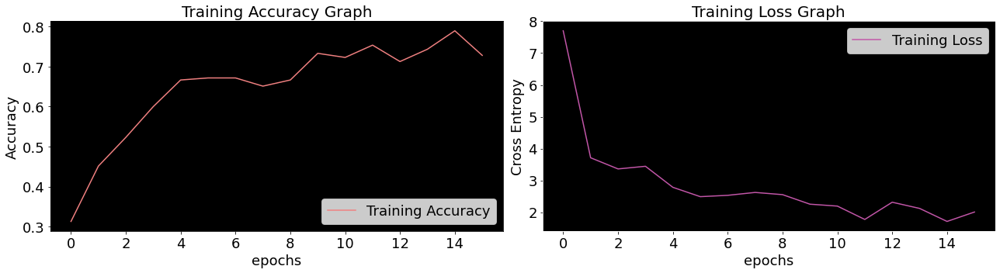

In [14]:
accuracy = history.history['accuracy']
loss = history.history['loss']

fig,axes=plt.subplots(1,2,figsize=(18,5))
plt.rc('xtick',labelsize=9)


axes[0].plot(accuracy, label='Training Accuracy', color='#F08080')
axes[0].tick_params(axis="x", labelsize=18)
axes[0].tick_params(axis="y", labelsize=18)

axes[0].legend(loc='lower right',fontsize=18)
axes[0].set_ylabel('Accuracy',fontsize=18)
axes[0].patch.set_facecolor("black")
axes[0].set_title('Training Accuracy Graph',fontsize=20)
axes[0].set_xlabel('epochs',fontsize=18)


axes[0].spines['left'].set_color('black') 
axes[0].spines['bottom'].set_color('black') 
axes[0].spines['right'].set_color('black') 
axes[0].spines['top'].set_color('black')



axes[1].plot(loss, label='Training Loss', color = '#C256A8')
axes[1].legend(loc='upper right',fontsize=18)
axes[1].set_ylabel('Cross Entropy',fontsize=18)
axes[1].patch.set_facecolor("black")
axes[1].set_title('Training Loss Graph',fontsize=20)
axes[1].set_xlabel('epochs',fontsize=18)

axes[1].tick_params(axis="x", labelsize=18)
axes[1].tick_params(axis="y", labelsize=18)

axes[1].spines['left'].set_color('white') 
axes[1].spines['bottom'].set_color('white') 
axes[1].spines['right'].set_color('white') 
axes[1].spines['top'].set_color('white') 
plt.tight_layout()
plt.show()

In [15]:
ytest=[]
xtest=[]
for features, label in test_data:
  ytest.append(label)
  xtest.append(features)
xtest=np.array(xtest).reshape(-1,image_size,image_size,3)
Ytest=np.array(ytest)
Xtest=xtest/255.0
print(Ytest)

[3 2 1 1 1 3 1 4 1 3 3 1 3 3 2 1 3 0 2 1 1 0 3 1 2 1 1 2 0 0 3 1 3 3 4 4 1
 2 4 3 2 3 2 1 0 0 2 3]


In [16]:
from sklearn.metrics import multilabel_confusion_matrix

probability_model = tf.keras.Sequential([model,tf.keras.layers.Softmax()])
predictions = probability_model.predict(Xtest)
#print(predictions)


final_classification=[]
for r in predictions:
    c=np.argmax(r)
    final_classification.append(c)
final_classification=np.array(final_classification)
print(final_classification)
print(Ytest)
M = multilabel_confusion_matrix(Ytest, final_classification)

tp = M[:, 1, 1]
tn = M[:, 0, 0]
fn = M[:, 1, 0]
fp = M[:, 0, 1]

accuracy = (sum(tn)+sum(tp))/(sum(tn)+ sum(fp)+ sum(fn)+sum(tp))
sensitivity = sum(tp) / (sum(tp)+sum(fn))
specificity = sum(tn) / (sum(tn) + sum(fp))
print(accuracy)
print(sensitivity)
print(specificity)

[3 2 4 1 0 3 4 4 1 3 3 1 3 3 2 4 3 0 2 1 4 1 3 1 2 1 4 2 3 0 3 3 3 3 4 4 4
 2 4 3 2 3 2 1 0 0 2 3]
[3 2 1 1 1 3 1 4 1 3 3 1 3 3 2 1 3 0 2 1 1 0 3 1 2 1 1 2 0 0 3 1 3 3 4 4 1
 2 4 3 2 3 2 1 0 0 2 3]
0.9166666666666666
0.7916666666666666
0.9479166666666666


In [17]:
vgg16_model.trainable = True
print("Number of layers in the base model: ", len(vgg16_model.layers))

# Fine-tune from this layer onwards
fine_tune_at_layer = 17

# Freeze all the layers before the `fine_tune_at_layer` layer
for layer in vgg16_model.layers[:fine_tune_at_layer]:
  layer.trainable =  False
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=model_learning_rate/10),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model.summary()
len(model.trainable_variables)
history_fine = model.fit(X,Y,batch_size=4,epochs=30)

from sklearn.metrics import multilabel_confusion_matrix

probability_model = tf.keras.Sequential([model,tf.keras.layers.Softmax()])
predictions = probability_model.predict(Xtest)
#print(predictions)


final_classification=[]
for r in predictions:
    c=np.argmax(r)
    final_classification.append(c)
final_classification=np.array(final_classification)
print(final_classification)
print(Ytest)
M = multilabel_confusion_matrix(Ytest, final_classification)

tp = M[:, 1, 1]
tn = M[:, 0, 0]
fn = M[:, 1, 0]
fp = M[:, 0, 1]

accuracy = (sum(tn)+sum(tp))/(sum(tn)+ sum(fp)+ sum(fn)+sum(tp))
sensitivity = sum(tp) / (sum(tp)+sum(fn))
specificity = sum(tn) / (sum(tn) + sum(fp))
print(accuracy)
print(sensitivity)
print(specificity)

Number of layers in the base model:  19
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 5)                 2565      
                                                                 
Total params: 14,717,253
Trainable params: 2,362,373
Non-trainable params: 12,354,880
_________________________________________________________________
Epoch 1/30


C:\Users\Ranjith ch\anaconda3\lib\site-packages\keras\optimizer_v2\rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


49/49 [==============================] - 23s 468ms/step - loss: 1199.9717 - accuracy: 0.4667
Epoch 2/30
49/49 [==============================] - 23s 477ms/step - loss: 539.0283 - accuracy: 0.4462
Epoch 3/30
49/49 [==============================] - 23s 474ms/step - loss: 355.2512 - accuracy: 0.5282
Epoch 4/30
49/49 [==============================] - 22s 455ms/step - loss: 244.1645 - accuracy: 0.6308
Epoch 5/30
49/49 [==============================] - 22s 447ms/step - loss: 214.3963 - accuracy: 0.7026
Epoch 6/30
49/49 [==============================] - 22s 447ms/step - loss: 220.9148 - accuracy: 0.6615
Epoch 7/30
49/49 [==============================] - 22s 454ms/step - loss: 173.7858 - accuracy: 0.7333
Epoch 8/30
49/49 [==============================] - 22s 446ms/step - loss: 169.6430 - accuracy: 0.7179
Epoch 9/30
49/49 [==============================] - 22s 447ms/step - loss: 138.6439 - accuracy: 0.7590
Epoch 10/30
49/49 [==============================] - 22s 448ms/step - loss: 97.9295

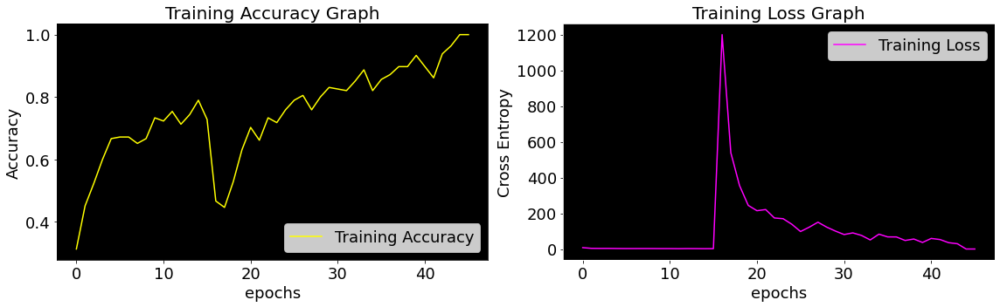

In [18]:
accuracy = history.history['accuracy']+history_fine.history['accuracy']
loss = history.history['loss']+history_fine.history['loss']


fig,axes=plt.subplots(1,2,figsize=(16,5))
plt.rc('xtick',labelsize=8)


axes[0].plot(accuracy, label='Training Accuracy', color='#FFFF00')
axes[0].tick_params(axis="x", labelsize=18)
axes[0].tick_params(axis="y", labelsize=18)

axes[0].legend(loc='lower right',fontsize=18)
axes[0].set_ylabel('Accuracy',fontsize=18)
axes[0].patch.set_facecolor("black")
axes[0].set_title('Training Accuracy Graph',fontsize=20)
axes[0].set_xlabel('epochs',fontsize=18)


axes[0].spines['left'].set_color('black') 
axes[0].spines['bottom'].set_color('black') 
axes[0].spines['right'].set_color('black') 
axes[0].spines['top'].set_color('black')



axes[1].plot(loss, label='Training Loss', color = '#FF00FF')
axes[1].legend(loc='upper right',fontsize=18)
axes[1].set_ylabel('Cross Entropy',fontsize=18)
axes[1].patch.set_facecolor("black")
axes[1].set_title('Training Loss Graph',fontsize=20)
axes[1].set_xlabel('epochs',fontsize=18)

axes[1].tick_params(axis="x", labelsize=18)
axes[1].tick_params(axis="y", labelsize=18)

axes[1].spines['left'].set_color('white') 
axes[1].spines['bottom'].set_color('white') 
axes[1].spines['right'].set_color('white') 
axes[1].spines['top'].set_color('white') 
plt.tight_layout()
plt.show()

[3 2 4 1 1 3 1 4 1 3 3 1 3 3 2 4 3 0 2 1 4 1 3 1 2 1 1 2 0 0 3 3 3 3 4 4 4
 2 4 3 2 3 2 1 0 0 2 3]
[3 2 1 1 1 3 1 4 1 3 3 1 3 3 2 1 3 0 2 1 1 0 3 1 2 1 1 2 0 0 3 1 3 3 4 4 1
 2 4 3 2 3 2 1 0 0 2 3]
0.95
0.875
0.96875
[3, 2, 1, 1, 1, 3, 1, 4, 1, 3, 3, 1, 3, 3, 2, 1, 3, 0, 2, 1, 1, 0, 3, 1, 2, 1, 1, 2, 0, 0, 3, 1, 3, 3, 4, 4, 1, 2, 4, 3, 2, 3, 2, 1, 0, 0, 2, 3]
[3, 2, 4, 1, 1, 3, 1, 4, 1, 3, 3, 1, 3, 3, 2, 4, 3, 0, 2, 1, 4, 1, 3, 1, 2, 1, 1, 2, 0, 0, 3, 3, 3, 3, 4, 4, 4, 2, 4, 3, 2, 3, 2, 1, 0, 0, 2, 3]


Text(0.5, 1.0, 'Confusion Matrix')

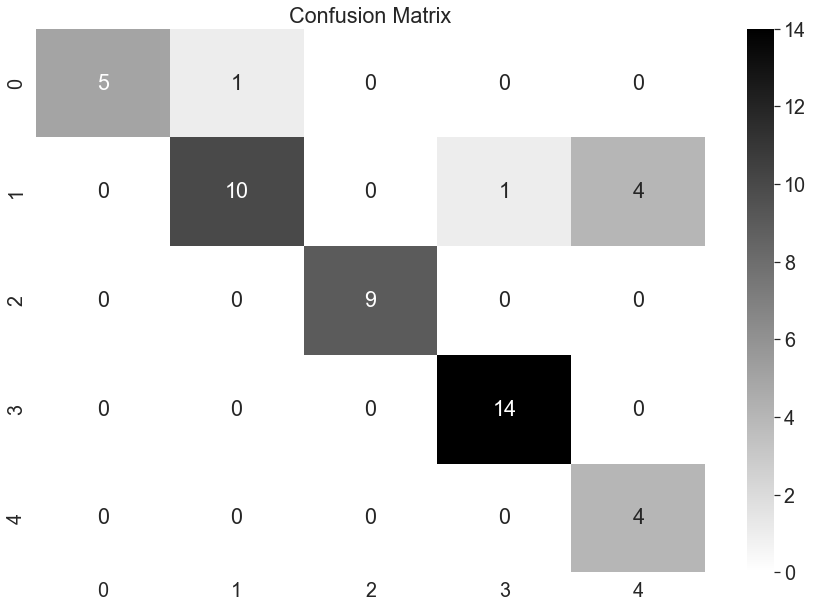

In [19]:
import seaborn as sns;
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import multilabel_confusion_matrix

probability_model = tf.keras.Sequential([model,tf.keras.layers.Softmax()])
predictions = probability_model.predict(Xtest)
#print(predictions)


final_classification=[]
for r in predictions:
    c=np.argmax(r)
    final_classification.append(c)
final_classification=np.array(final_classification)
print(final_classification)
print(Ytest)
M = multilabel_confusion_matrix(Ytest, final_classification)

tp = M[:, 1, 1]
tn = M[:, 0, 0]
fn = M[:, 1, 0]
fp = M[:, 0, 1]

accuracy = (sum(tn)+sum(tp))/(sum(tn)+ sum(fp)+ sum(fn)+sum(tp))
sensitivity = sum(tp) / (sum(tp)+sum(fn))
specificity = sum(tn) / (sum(tn) + sum(fp))
print(accuracy)
print(sensitivity)
print(specificity)
sns.set()
y_true = Ytest.tolist()
y_pred = final_classification.tolist()
plt.figure(figsize=(15, 10))
print(y_true)
print(y_pred)
C2= confusion_matrix(y_true, y_pred, labels=[0,1,2,3,4])
sns.set(font_scale=1.8)
sns.heatmap(C2,annot=True,cmap="gist_yarg")
plt.title('Confusion Matrix')



In [20]:
import matplotlib.cm as cm
from tensorflow import keras

last_conv_layer_name = "block5_conv3"
classifier_layer_names = [
    "global_average_pooling2d",
    "dense",
]

def create_gradcam_heatmaps(
    img_array, model, last_conv_layer_name, classifier_layer_names
):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer
    last_conv_layer = vgg16_model.get_layer(last_conv_layer_name)
    last_conv_layer_model = keras.Model(vgg16_model.inputs, last_conv_layer.output)

    # layer to the final class predictions
    classifier_layer_input = keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_layer_input
    for layer_name in classifier_layer_names:
        x = model.get_layer(layer_name)(x)
    classifier_model = keras.Model(classifier_layer_input, x)

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        # Compute activations of the last conv layer and make the tape watch it
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)
        # Compute class predictions
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]

    # This is the gradient of the top predicted class with regard to
    # the output feature map of the last conv layer
    grads = tape.gradient(top_class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

In [21]:
heatmaps=[]
for i in range(len(Xtest)):
  img_ax=Xtest[i]
  img_ax = np.expand_dims(img_ax, axis=0)

  heatmap = create_gradcam_heatmaps(img_ax, model, last_conv_layer_name, classifier_layer_names)
  heatmaps.append(heatmap)

C:\Users\RANJIT~1\AppData\Local\Temp/ipykernel_33116/3865707473.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10,5))


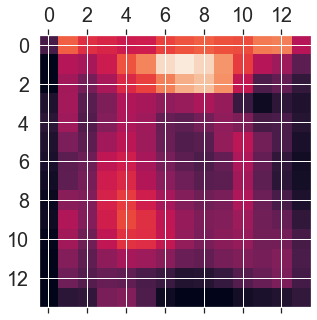

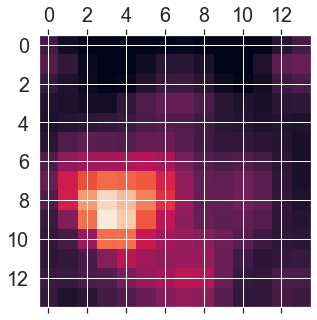

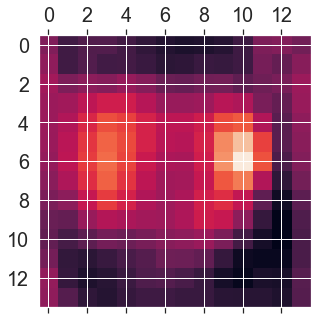

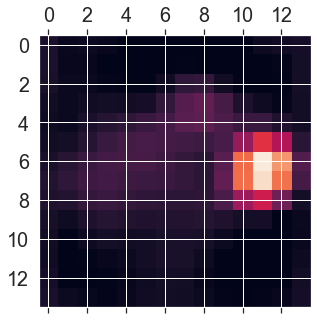

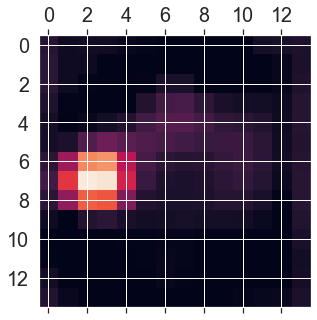

...

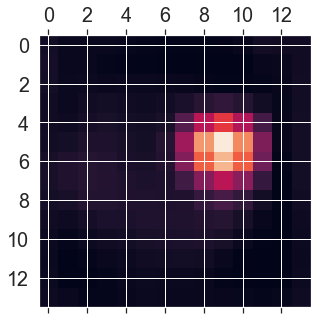

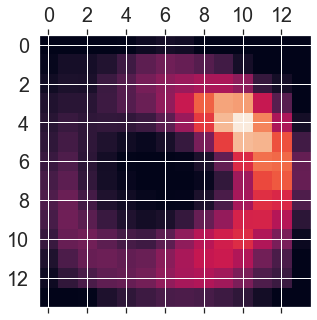

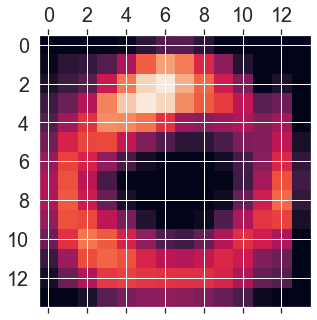

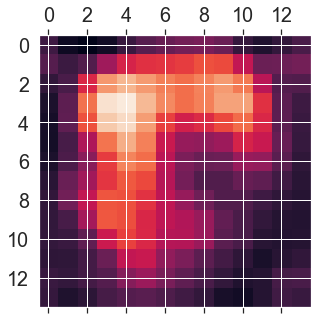

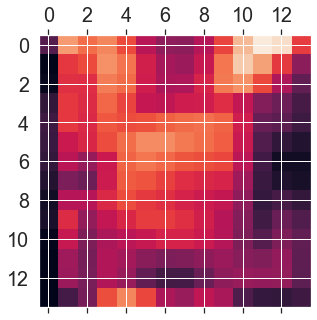

In [22]:
for heatmap in heatmaps:
  fig, ax = plt.subplots(figsize=(10,5))
  ax.matshow(heatmap)

In [23]:
def ContructCam(IMG,heatmap,y,count,row,colom):
  # We load the original image
  r=np.zeros((IMG.shape))
  r=IMG
  img = keras.preprocessing.image.img_to_array(r)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)
  img=np.uint8(255 * img)
  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap+img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)


  
  plt.title(str(y))
  plt.subplot(row,colom, count+1)
  plt.grid(False)
  sideimge=np.hstack([superimposed_img,img])
  plt.imshow(sideimge)
  print(sideimge.shape)
  plt.axis('off')
  
  return superimposed_img
 

(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
6


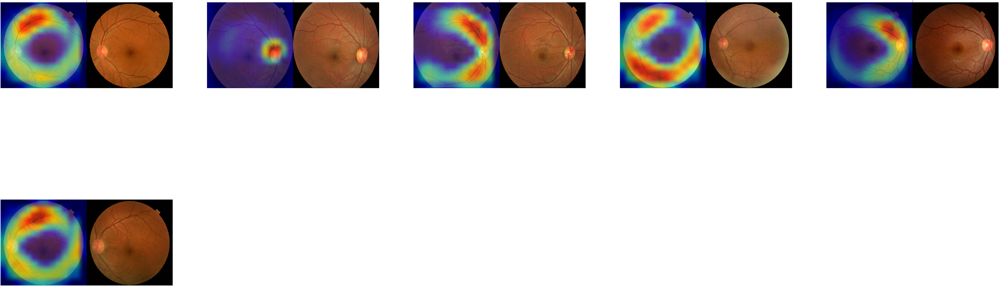

In [24]:
count=0
testedmap=[]
plt.figure(figsize=(224, 448))
for img,heatmap,y in zip(Xtest,heatmaps,Ytest):
  if(y==0):
    
    testedmap=ContructCam(img,heatmap,y,count,10,5)
    count=count+1
print(count)  

In [25]:
count=0
testedmap=[]
plt.figure(figsize=(224, 448))
for img,heatmap,y in zip(Xtest,heatmaps,Ytest):
  if(y==1):
    
    testedmap=ContructCam(img,heatmap,y,count,10,5)
    count=count+1
print(count)  

(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
15


(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
9


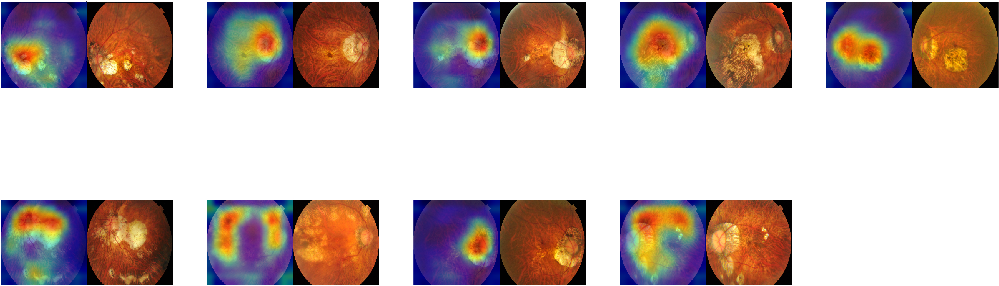

In [26]:
count=0
testedmap=[]
plt.figure(figsize=(224, 448))
for img,heatmap,y in zip(Xtest,heatmaps,Ytest):
  if(y==2):
    
    testedmap=ContructCam(img,heatmap,y,count,10,5)
    count=count+1
print(count)  

In [27]:
count=0
testedmap=[]
plt.figure(figsize=(224, 448))
for img,heatmap,y in zip(Xtest,heatmaps,Ytest):
  if(y==3):
    
    testedmap=ContructCam(img,heatmap,y,count,10,5)
    count=count+1
print(count)  

(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
14


(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
(224, 448, 3)
4


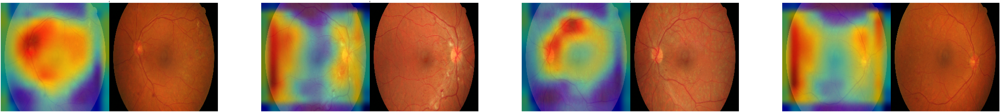

In [28]:
count=0
testedmap=[]
plt.figure(figsize=(224, 448))
for img,heatmap,y in zip(Xtest,heatmaps,Ytest):
  if(y==4):
    
    testedmap=ContructCam(img,heatmap,y,count,10,5)
    count=count+1
print(count)  